In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import re
%pip install rapidfuzz
from rapidfuzz import fuzz, process

url = r"/home/youssef/Desktop/Jobs_Data/Reports_Data/Job_Titles.csv"
df = pd.read_csv(url) 
df.head()

Note: you may need to restart the kernel to use updated packages.


,job_title,jobs_count
0,registered nurse,18264
1,rn,15781
2,lead sales associate,12435
3,customer service representative,10973
4,travel allied health professional,9203


In [2]:
all_titles = df['job_title'].unique().tolist()
for title in all_titles:
    print(title)

registered nurse
rn
lead sales associate
customer service representative
travel allied health professional
store manager
assistant manager
host
shift manager
registered nurse (rn)
travel rn
first year tax professional
hair stylist
physician
nurse practitioner
restaurant manager
part
account executive
veterinarian
senior accountant
hourly supervisor & training
travel nurse rn
project manager
assistant general manager
assistant salon manager
maintenance supervisor
executive assistant
dentist
supervisor
production supervisor
hourly supervisor and training
superintendent
on
ct technologist
operations assistant manager
sales consultant
senior project manager
sous chef
radiologic technologist
travel nurse
shift leader
full
accounting manager
to go specialist
manager
department manager
operations manager
maintenance technician
line cook
guest advocate (cashier or front of store attendant
office manager
accountant
department supervisor
account manager
assistant store manager
ob
service advisor

In [3]:
# Fill missing job titles with empty string
df["job_title"] = df["job_title"].fillna("")

# Clean job title column
df["job_title_clean"] = (
    df["job_title"]
    .str.lower()
    .str.strip()
    .str.replace(r"[^a-z\s]", " ", regex=True)
    .str.replace(r"\s+", " ", regex=True)
)

# Define clusters based on main keywords
clusters = {
    "Account Roles": ["account"],
    "Access Roles": ["access", "accessibility"],
    "Healthcare Roles": ["healthcare", "health tech", "nurse", "rn", "behavioral health"],
    "Sales Roles": ["sales", "business development"],
    "Legal Roles": ["lawyer", "attorney", "bankruptcy"],
    "Administrative Roles": ["administrator", "supervisor", "officer", "coordinator", "manager"],
    "IT and Systems Roles": ["acas", "systems administrator", "security clearance", "it", "software", "engineer"],
    "Finance and Accounting Roles": ["acca", "accounting", "cpa", "finance", "audit"],
    "Accelerator and Scientific Roles": ["accelerator", "physicist", "compute systems", "diagnostician", "science"],
    "Accident and Claims Roles": ["accident", "claims", "insurance"],
    "Accommodation Roles": ["accommodation", "accommodations", "hospitality"],
    "Retail and Accessories Roles": ["accessories", "retail", "merchandise", "shop"],
    "Project and Program Management": ["project", "program", "delivery", "portfolio"],
    "Marketing Roles": ["marketing", "brand", "advertising", "communications", "public relations"],
    "Consulting Roles": ["consultant", "consultancy", "advisor", "strategy"],
    "Education and Training": ["teacher", "trainer", "education", "learning", "instructor"],
    "Customer Service Roles": ["customer service", "support", "client", "care"],
    "Operations Roles": ["operations", "logistics", "supply chain", "production", "inventory"],
    "Medical Roles": ["doctor", "physician", "pharma", "therapist", "medical"],
    "Creative Roles": ["designer", "creative", "artist", "illustrator", "photography"],
    "Legal and Compliance Roles": ["compliance", "regulatory", "risk", "legal"],
    "Human Resources Roles": ["hr", "human resources", "talent", "recruitment", "people"],
    "Transportation and Driving": ["driver", "truck", "fleet", "transportation", "logistics"],
    "Maintenance and Technical": ["technician", "maintenance", "engineer", "mechanic", "electrician"],
    "Food and Hospitality": ["chef", "cook", "restaurant", "catering", "hospitality"],
    "Miscellaneous": []
}

# Stepwise classification function
def classify_job(title):
    title = str(title)
    
    # Step 1: Cluster keyword matching
    for cluster_name, keywords in clusters.items():
        for kw in keywords:
            if kw in title:
                # Step 2: Specific patterns inside cluster
                # Account cluster examples
                if cluster_name == "Account Roles":
                    if re.search(r"\baccount\s+(executive|exec|exectutive|ae)\b", title):
                        return "Account Executive"
                    if re.search(r"\baccount\s+(manager|lead|director|senior|sr|project|program)\b", title):
                        return "Account Manager"
                    if re.search(r"\baccount\s+development\b", title):
                        return "Account Development"
                    if re.search(r"\baccount\s+based\s+marketing\b", title):
                        return "Account Marketing"
                    if re.search(r"\baccount\s+(analyst|auditor|clerk|compliance|associate|consultant|charge)\b", title):
                        return "Account Finance and Compliance"
                    return "Account General Roles"
                
                # Access cluster
                if cluster_name == "Access Roles":
                    if re.search(r"\baccess\s+(control|administrator|security|escort|provisioning|engineer)\b", title):
                        return "Access Control and Security"
                    return "Access General Roles"
                
                # Healthcare cluster
                if cluster_name == "Healthcare Roles":
                    return "Healthcare Roles"
                
                # Sales cluster
                if cluster_name == "Sales Roles":
                    return "Sales Roles"
                
                # Legal cluster
                if cluster_name == "Legal Roles":
                    return "Legal Roles"
                
                # Administrative cluster
                if cluster_name == "Administrative Roles":
                    return "Administrative Roles"
                
                # IT and Systems cluster
                if cluster_name == "IT and Systems Roles":
                    return "IT and Systems Roles"
                
                # Finance and Accounting cluster
                if cluster_name == "Finance and Accounting Roles":
                    return "Finance and Accounting Roles"
                
                # Accelerator and Scientific cluster
                if cluster_name == "Accelerator and Scientific Roles":
                    return "Accelerator and Scientific Roles"
                
                # Accident and Claims cluster
                if cluster_name == "Accident and Claims Roles":
                    return "Accident and Claims Roles"
                
                # Accommodation cluster
                if cluster_name == "Accommodation Roles":
                    return "Accommodation Roles"
                
                # Retail cluster
                if cluster_name == "Retail and Accessories Roles":
                    return "Retail and Accessories Roles"
                
                # Project management cluster
                if cluster_name == "Project and Program Management":
                    return "Project and Program Management"
                
                # Marketing cluster
                if cluster_name == "Marketing Roles":
                    return "Marketing Roles"
                
                # Consulting cluster
                if cluster_name == "Consulting Roles":
                    return "Consulting Roles"
                
                # Education cluster
                if cluster_name == "Education and Training":
                    return "Education and Training"
                
                # Customer service cluster
                if cluster_name == "Customer Service Roles":
                    return "Customer Service Roles"
                
                # Operations cluster
                if cluster_name == "Operations Roles":
                    return "Operations Roles"
                
                # Medical cluster
                if cluster_name == "Medical Roles":
                    return "Medical Roles"
                
                # Creative cluster
                if cluster_name == "Creative Roles":
                    return "Creative Roles"
                
                # Human resources cluster
                if cluster_name == "Human Resources Roles":
                    return "Human Resources Roles"
                
                # Transportation cluster
                if cluster_name == "Transportation and Driving":
                    return "Transportation and Driving"
                
                # Maintenance cluster
                if cluster_name == "Maintenance and Technical":
                    return "Maintenance and Technical"
                
                # Food cluster
                if cluster_name == "Food and Hospitality":
                    return "Food and Hospitality"
                
                # Fallback inside cluster
                return cluster_name
    
    # Step 3: Anything else goes to Other
    return "Other"

# Apply classification
df["job_category"] = df["job_title_clean"].apply(classify_job)

# Aggregate job counts
df_final = (
    df
    .groupby("job_category", as_index=False)["jobs_count"]
    .sum()
    .sort_values(by="jobs_count", ascending=False)
)

print(df_final)

                        job_category  jobs_count
27                             Other      381646
11              Administrative Roles      293322
18                  Healthcare Roles      196688
20              IT and Systems Roles      163848
30                       Sales Roles       55187
25                     Medical Roles       43274
14            Customer Service Roles       28895
23         Maintenance and Technical       26811
12                  Consulting Roles       22317
8              Account General Roles       20659
15            Education and Training       19250
17              Food and Hospitality       16956
6                  Account Executive       10817
26                  Operations Roles       10627
9                    Account Manager       10582
28    Project and Program Management        8665
29      Retail and Accessories Roles        8026
19             Human Resources Roles        6214
13                    Creative Roles        4910
22        Legal and 

In [4]:
# Fill missing job titles with empty string
df["job_title"] = df["job_title"].fillna("")

# Clean job title column
df["job_title_clean"] = (
    df["job_title"]
    .str.lower()
    .str.strip()
    .str.replace(r"[^a-z\s]", " ", regex=True)
    .str.replace(r"\s+", " ", regex=True)
)

# Define clusters based on main keywords for academic jobs
clusters = {
    "Academic Teaching Roles": [
        "tutor", "teaching", "instructor", "trainer", "coach", "education", "learning", "academy"
    ],
    "Academic Leadership Roles": [
        "lead", "manager", "director", "principal", "head", "supervisor", "chief", "administrator"
    ],
    "Academic Clinical Roles": [
        "physician", "doctor", "nurse", "pediatric", "surgery", "oncology", "radiology",
        "gynecology", "obgyn", "urology", "dermatology", "gastroenterology", "neurology",
        "psychiatry", "pulmonary", "cardiology", "hepatology", "transplant", "plastic surgery",
        "hospitalist", "endoscopy", "interventional", "therapist"
    ],
    "Academic Research Roles": [
        "research", "scientist", "laboratory", "pathology", "genetics", "forensics", "molecular"
    ],
    "Academic Support Roles": [
        "assistant", "coordinator", "advisor", "liaison", "specialist", "analyst", "support",
        "interventionist", "scheduler", "skills", "services", "standards"
    ],
    "Academic Technology Roles": [
        "technology", "tech", "systems", "it", "multimedia", "audio visual", "av"
    ],
    "Academic Administrative Roles": [
        "office", "personnel", "operations", "records", "hr", "payroll", "planning", "governance"
    ],
    "Other Academic Roles": []
}

# Stepwise classification function
def classify_academic(title):
    title = str(title)
    
    for cluster_name, keywords in clusters.items():
        for kw in keywords:
            if kw in title:
                # Specific rules inside cluster to reduce Other
                if cluster_name == "Academic Teaching Roles":
                    if re.search(r"\b(tutor|instructor|teacher|coach)\b", title):
                        return "Academic Teaching Roles"
                    return "Academic Teaching Roles"
                
                if cluster_name == "Academic Leadership Roles":
                    return "Academic Leadership Roles"
                
                if cluster_name == "Academic Clinical Roles":
                    return "Academic Clinical Roles"
                
                if cluster_name == "Academic Research Roles":
                    return "Academic Research Roles"
                
                if cluster_name == "Academic Support Roles":
                    return "Academic Support Roles"
                
                if cluster_name == "Academic Technology Roles":
                    return "Academic Technology Roles"
                
                if cluster_name == "Academic Administrative Roles":
                    return "Academic Administrative Roles"
                
                return cluster_name
    
    # Anything else goes here
    return "Other Academic Roles"

# Apply classification
df["job_category"] = df["job_title_clean"].apply(classify_academic)

# Aggregate job counts
df_final_2 = (
    df
    .groupby("job_category", as_index=False)["jobs_count"]
    .sum()
    .sort_values(by="jobs_count", ascending=False)
)

print(df_final_2)

                    job_category  jobs_count
7           Other Academic Roles      458904
2      Academic Leadership Roles      404626
6      Academic Technology Roles      155983
1        Academic Clinical Roles      149982
4         Academic Support Roles      122839
5        Academic Teaching Roles       28235
3        Academic Research Roles       17496
0  Academic Administrative Roles       10358


In [5]:
# Fill missing job titles with empty string
df["job_title"] = df["job_title"].fillna("")

# Clean job title column
df["job_title_clean"] = (
    df["job_title"]
    .str.lower()
    .str.strip()
    .str.replace(r"[^a-z\s]", " ", regex=True)
    .str.replace(r"\s+", " ", regex=True)
)

# Define academic clusters based on main keywords
clusters = {
    # Tutoring and Coaching
    "Academic English Tutoring": ["academic english private tutoring jobs", "english tutor", "english coaching"],
    "Academic Coaching": ["academic coach", "career coach", "learning specialist", "student success", "transition program", "academic advising", "academic adviser", "academic advisor"],

    # Teaching and Instruction
    "Academic Teaching Roles": ["teacher", "lecturer", "instructor", "professor", "faculty", "educator"],

    # Clinical and Medical
    "Academic Clinical Roles": ["physician", "doctor", "hospitalist", "internist", "pediatrician", "psychiatrist", "cardiologist", "endocrinologist", "dermatologist", "anesthesiologist", "surgeon", "radiologist", "oncologist", "neurologist", "gastroenterologist", "electrophysiologist", "breast radiologist", "breast surgeon", "cardiac surgeon"],

    # Research
    "Academic Research Roles": ["research", "scientist", "lab", "laboratory", "principal investigator", "postdoctoral", "research fellow"],

    # Administrative and Coordination
    "Academic Administrative Roles": ["advisor", "administrator", "department manager", "program manager", "academic affairs", "coordinator", "manager"],

    # Technology
    "Academic Technology Roles": ["technology", "it specialist", "computing specialist", "academic computing", "software", "engineer"],

    # Specialty and Others
    "Academic Specialty Roles": ["dermatopathologist", "oncology", "cardiology", "neurology", "endocrinology", "gastroenterology", "radiology", "surgery", "electrophysiology"],

    # Fallback
    "Other Academic Roles": ["academic"]
}

# Stepwise classification function
def classify_job(title):
    title = str(title)
    
    # Step 1: Cluster keyword matching
    for cluster_name, keywords in clusters.items():
        for kw in keywords:
            if kw in title:
                
                # Step 2: Specific patterns inside cluster
                
                # Academic Coaching detailed roles
                if cluster_name == "Academic Coaching":
                    if re.search(r"\bacademic coach\b", title):
                        return "Academic Coach"
                    if re.search(r"\bcareer coach\b", title):
                        return "Career Coach"
                    if re.search(r"\bstudent success\b", title):
                        return "Student Success Specialist"
                    return "General Academic Coaching"
                
                # Academic English Tutoring
                if cluster_name == "Academic English Tutoring":
                    return "Academic English Tutoring"
                
                # Teaching and Instruction
                if cluster_name == "Academic Teaching Roles":
                    return "Teaching and Instruction"
                
                # Clinical and Medical
                if cluster_name == "Academic Clinical Roles":
                    # example subcategories
                    if "pediatrician" in title:
                        return "Pediatrician"
                    if "psychiatrist" in title:
                        return "Psychiatrist"
                    return "Medical and Clinical"
                
                # Research
                if cluster_name == "Academic Research Roles":
                    return "Research Roles"
                
                # Administrative
                if cluster_name == "Academic Administrative Roles":
                    return "Administrative Roles"
                
                # Technology
                if cluster_name == "Academic Technology Roles":
                    return "Technology Roles"
                
                # Specialty
                if cluster_name == "Academic Specialty Roles":
                    return "Specialty Roles"
                
                # Fallback inside cluster
                return cluster_name
    
    # Step 3: Anything else goes to Other
    return "Other Academic Roles"

# Apply classification
df["job_category"] = df["job_title_clean"].apply(classify_job)

# Instead of summing jobs_count, we just get counts per category
df_final_3 = df["job_category"].value_counts().reset_index()
df_final_3.columns = ["job_category", "count"]

# Sort descending
df_final_3 = df_final_3.sort_values(by="count", ascending=False)

print(df_final_3)

                  job_category   count
0         Other Academic Roles  211508
1         Administrative Roles   73077
2             Technology Roles   25168
3     Teaching and Instruction   12167
4         Medical and Clinical   11616
5               Research Roles   10627
6              Specialty Roles    3042
7                 Psychiatrist    1080
8    Academic English Tutoring     402
9                 Pediatrician     273
10   General Academic Coaching      94
11                Career Coach      27
12              Academic Coach      20
13  Student Success Specialist      15


In [6]:
# Fill missing job titles
df["job_title"] = df["job_title"].fillna("")

# Clean job title column
df["job_title_clean"] = (
    df["job_title"]
    .str.lower()
    .str.strip()
    .str.replace(r"[^a-z\s]", " ", regex=True)
    .str.replace(r"\s+", " ", regex=True)
)

# Define detailed clusters for your job titles
clusters = {
    # Recruiting & HR
    "Recruitment & HR": ["recruiter", "talent", "hr", "human resources", "employment", "engagement"],

    # Medical & Healthcare
    "Physicians & Specialists": ["physician", "doctor", "hospitalist", "cardiologist", "neurologist",
                                 "gastroenterologist", "radiologist", "surgeon", "psychiatrist", "anesthesiologist",
                                 "pediatrician", "oncologist", "pathologist", "dermatologist", "family practice"],
    "Nurses & Care Staff": ["nurse", "rn", "np", "registered nurse", "pediatric hospitalist", "licensed practical nurse"],
    "Therapists & Clinical Staff": ["therapist", "clinical", "mental health", "behavioral health", "counselor", "aba therapist", "social worker", "psychologist"],

    # Academic & Teaching
    "Academic & Teaching Roles": ["teacher", "instructor", "lecturer", "professor", "faculty", "education", "training"],

    # Technical & IT
    "IT & Software Engineering": ["software", "engineer", "developer", "architect", "it", "cloud", "etl", "gcp", "aws", "abinitio", "circuit design", "technical writer"],

    # Administrative & Managerial
    "Administration & Management": ["manager", "administrator", "supervisor", "coordinator", "director", "lead"],

    # Sales & Marketing
    "Sales & Marketing": ["sales", "account manager", "brand", "marketing", "campaign", "business development", "commercial"],

    # Logistics & Operations
    "Operations & Logistics": ["logistics", "operations", "supply chain", "inventory", "production", "field"],

    # Manufacturing & Engineering
    "Manufacturing & Engineering": ["mechanic", "technician", "engineer", "manufacturing", "maintenance", "a p mechanic", "a&p", "assembly"],

    # Hospitality & Food
    "Hospitality & Food Services": ["chef", "cook", "restaurant", "catering", "hospitality", "housekeeping", "aide"],

    # Legal & Compliance
    "Legal & Compliance": ["attorney", "lawyer", "corporate lawyer", "litigation", "legal", "compliance"],

    # Other / Misc
    "Other Roles": []  # Fallback
}

# Function to classify job titles
def classify_job(title):
    title = str(title)
    for cluster_name, keywords in clusters.items():
        for kw in keywords:
            if kw in title:
                return cluster_name
    return "Other Roles"

# Apply classification
df["job_category"] = df["job_title_clean"].apply(classify_job)

# Aggregate job counts
df_final_4 = (
    df.groupby("job_category", as_index=False)["jobs_count"]
    .sum()
    .sort_values(by="jobs_count", ascending=False)
)

print(df_final_4)

                   job_category  jobs_count
8                   Other Roles      412521
1   Administration & Management      314222
3     IT & Software Engineering      198526
6           Nurses & Care Staff      189202
9      Physicians & Specialists       48956
12  Therapists & Clinical Staff       43121
0     Academic & Teaching Roles       35776
11            Sales & Marketing       31352
5   Manufacturing & Engineering       25485
10             Recruitment & HR       15947
2   Hospitality & Food Services       15449
7        Operations & Logistics       13508
4            Legal & Compliance        4358


In [7]:
# Fill missing job titles
df["job_title"] = df["job_title"].fillna("")

# Clean job title column
df["job_title_clean"] = (
    df["job_title"]
    .str.lower()
    .str.strip()
    .str.replace(r"[^a-z\s]", " ", regex=True)
    .str.replace(r"\s+", " ", regex=True)
)

# Define main clusters and keywords
clusters = {
    "Account Roles": ["account", "client", "ae"],
    "Healthcare Roles": ["nurse", "rn", "physician", "doctor", "pa", "medical", "therapist", "hospitalist", "psychiatrist", "oncologist", "cardiologist", "surgeon", "pathologist", "radiologist", "gastroenterologist", "anesthesiologist", "pediatrician"],
    "Education Roles": ["teacher", "instructor", "trainer", "educator", "professor", "substitute", "grade", "k 12", "high school", "middle school", "elementary school", "coach", "advisor", "principal", "head"],
    "Administrative Roles": ["administrator", "supervisor", "officer", "coordinator", "manager", "lead", "director", "head"],
    "IT and Engineering Roles": ["engineer", "developer", "technician", "technologist", "it", "systems", "administrator", "programmer", "cnc", "technical"],
    "Sales and Retail Roles": ["sales", "retail", "store", "shop", "commercial", "account executive", "business development"],
    "Finance and Accounting Roles": ["finance", "accounting", "cpa", "budget", "analyst", "audit", "treasury"],
    "Human Resources Roles": ["hr", "human resources", "recruitment", "talent", "people", "employment"],
    "Operations and Logistics": ["operations", "logistics", "supply chain", "production", "inventory", "field", "facility"],
    "Marketing Roles": ["marketing", "brand", "communications", "advertising", "pr", "social media"],
    "Customer Service Roles": ["customer service", "support", "client", "care", "call center", "representative"],
    "Emergency and Public Safety": ["911", "emergency", "dispatcher", "crisis", "lifeline", "piping", "fire", "police"],
    "Maintenance and Technical": ["maintenance", "mechanic", "electrician", "millwright", "technician", "technologist", "power engineer"],
    "Food and Hospitality": ["chef", "cook", "restaurant", "hospitality", "catering", "kitchen", "housekeeping"],
    "Creative Roles": ["designer", "creative", "artist", "illustrator", "photography"],
    "Legal and Compliance Roles": ["lawyer", "attorney", "legal", "compliance", "regulatory", "risk", "claims"],
    "Miscellaneous": []
}

# Stepwise classification function
def classify_job(title):
    title = str(title)
    
    for cluster_name, keywords in clusters.items():
        for kw in keywords:
            if kw in title:
                # Sub-patterns for more precise classification
                if cluster_name == "Account Roles":
                    if re.search(r"\baccount\s+(executive|ae)\b", title):
                        return "Account Executive"
                    if re.search(r"\baccount\s+(manager|lead|director|senior|sr)\b", title):
                        return "Account Manager"
                    return "Account General"
                
                if cluster_name == "Healthcare Roles":
                    if "nurse" in title or "rn" in title:
                        return "Registered Nurse"
                    if any(doc in title for doc in ["physician", "doctor", "pa", "hospitalist", "pediatrician", "psychiatrist", "oncologist", "cardiologist", "surgeon", "radiologist", "pathologist", "gastroenterologist", "anesthesiologist"]):
                        return "Physician / Specialist"
                    return "Healthcare General"
                
                if cluster_name == "Education Roles":
                    if "coach" in title:
                        return "Sports / Coaching"
                    if "teacher" in title or "instructor" in title or "educator" in title:
                        return "Teaching / Academic"
                    return "Education General"
                
                if cluster_name == "Administrative Roles":
                    return "Administrative / Management"
                
                if cluster_name == "IT and Engineering Roles":
                    return "IT / Engineering / Technical"
                
                if cluster_name == "Sales and Retail Roles":
                    return "Sales / Retail"
                
                if cluster_name == "Finance and Accounting Roles":
                    return "Finance / Accounting"
                
                if cluster_name == "Human Resources Roles":
                    return "Human Resources / Talent"
                
                if cluster_name == "Operations and Logistics":
                    return "Operations / Logistics / Facility"
                
                if cluster_name == "Marketing Roles":
                    return "Marketing / Communications"
                
                if cluster_name == "Customer Service Roles":
                    return "Customer Service / Support"
                
                if cluster_name == "Emergency and Public Safety":
                    return "Emergency / Public Safety"
                
                if cluster_name == "Maintenance and Technical":
                    return "Maintenance / Technical"
                
                if cluster_name == "Food and Hospitality":
                    return "Food / Hospitality"
                
                if cluster_name == "Creative Roles":
                    return "Creative / Design"
                
                if cluster_name == "Legal and Compliance Roles":
                    return "Legal / Compliance"
                
                return cluster_name
    
    # Fallback
    return "Miscellaneous"

# Apply classification
df["job_category"] = df["job_title_clean"].apply(classify_job)

# Aggregate counts (if column jobs_count exists)
if "jobs_count" in df.columns:
    df_final_5 = df.groupby("job_category", as_index=False)["jobs_count"].sum().sort_values(by="jobs_count", ascending=False)
else:
    df_final_5 = df["job_category"].value_counts().reset_index()
    df_final_5.columns = ["job_category", "count"]

print(df_final_5)

                         job_category  jobs_count
3         Administrative / Management      350480
16                      Miscellaneous      236710
19                   Registered Nurse      193717
12       IT / Engineering / Technical      186730
18             Physician / Specialist      107404
15         Marketing / Communications       51966
20                     Sales / Retail       31936
6                   Education General       29322
1                     Account General       27101
8                Finance / Accounting       23858
10                 Healthcare General       21134
22                Teaching / Academic       15891
9                  Food / Hospitality       11835
0                   Account Executive       10798
2                     Account Manager       10576
17  Operations / Logistics / Facility        8099
5          Customer Service / Support        7264
14            Maintenance / Technical        5269
21                  Sports / Coaching        4521


In [8]:
# Fill missing job titles with empty string
df['job_title'] = df['job_title'].fillna("")

# Clean job title column
df['job_title_clean'] = (
    df['job_title']
    .str.lower()
    .str.strip()
    .str.replace(r"[^a-z\s]", " ", regex=True)
    .str.replace(r"\s+", " ", regex=True)
)

# Define main clusters
clusters = {
    "Account Roles": ["account", "client", "finance"],
    "Healthcare Roles": ["nurse", "rn", "physician", "doctor", "medical", "therapist", "healthcare", "pharmacy", "oncology", "icu"],
    "Education Roles": ["teacher", "instructor", "trainer", "educator", "school", "academy"],
    "Sales Roles": ["sales", "business development", "bdm", "retail"],
    "IT and Technical Roles": ["it", "software", "engineer", "developer", "technical", "systems", "network", "support"],
    "Operations and Warehouse": ["warehouse", "logistics", "operations", "shipping", "receiving", "material handler", "forklift", "production", "assembly", "manufacturing", "plant", "maintenance", "line lead", "packaging", "process technician"],
    "Human Resources Roles": ["hr", "human resources", "talent", "recruitment"],
    "Administrative Roles": ["administrator", "coordinator", "officer", "manager", "assistant", "supervisor", "lead"],
    "Marketing Roles": ["marketing", "brand", "advertising", "communications", "public relations"],
    "Legal Roles": ["legal", "attorney", "lawyer", "compliance", "risk"],
    "Customer Service Roles": ["customer service", "support", "client", "csr", "representative"],
    "Creative Roles": ["designer", "creative", "artist", "illustrator", "photography", "3d", "cad", "graphics", "modeler"],
    "Finance and Accounting Roles": ["accounting", "finance", "audit", "cpa", "analyst", "tax"],
    "Food and Hospitality": ["chef", "cook", "restaurant", "catering", "hospitality"],
    "Other / Miscellaneous": []
}

# Advanced classification function
def classify_job(title):
    title = str(title)
    title_clean = re.sub(r'^\d+\s*', '', title)  # remove leading numbers
    title_clean = title_clean.strip()

    # First match cluster keywords
    for cluster_name, keywords in clusters.items():
        for kw in keywords:
            if kw in title_clean:
                # Handle shift-based roles inside Operations
                if "shift" in title_clean or re.search(r'\b1st\b|\b2nd\b|\b3rd\b|\b4th\b', title_clean):
                    if cluster_name in ["Operations and Warehouse", "Maintenance"]:
                        if "supervisor" in title_clean or "lead" in title_clean or "manager" in title_clean:
                            return "Operations / Production Supervisor"
                        else:
                            return "Operations / Production Staff"
                
                # Handle IT engineers
                if cluster_name == "IT and Technical Roles":
                    if "support" in title_clean or "technician" in title_clean:
                        return "IT Support / Technician"
                    return "IT Engineer / Developer"

                # Handle creative 3D roles
                if cluster_name == "Creative Roles" and "3d" in title_clean:
                    return "3D / CAD Designer"

                # Default cluster
                return cluster_name

    # If no cluster matched
    return "Other / Miscellaneous"

# Apply classification
df['job_category'] = df['job_title_clean'].apply(classify_job)

# Optional: Aggregate counts
df_final_6 = df.groupby('job_category', as_index=False)['jobs_count'].sum().sort_values(by='jobs_count', ascending=False)

print(df_final_6)

                          job_category  jobs_count
16               Other / Miscellaneous      351321
1                 Administrative Roles      254352
7                     Healthcare Roles      247660
9              IT Engineer / Developer      204840
17                         Sales Roles       67420
0                        Account Roles       49379
15            Operations and Warehouse       47866
5         Finance and Accounting Roles       29395
4                      Education Roles       26518
3               Customer Service Roles       19432
6                 Food and Hospitality       14064
10             IT Support / Technician       10305
8                Human Resources Roles        9312
2                       Creative Roles        6772
11                         Legal Roles        4617
12                     Marketing Roles        2831
14  Operations / Production Supervisor        1478
13       Operations / Production Staff         861


In [9]:
# Fill missing job titles
df['job_title'] = df['job_title'].fillna('')

# Clean job titles
df['job_title_clean'] = (
    df['job_title']
    .str.lower()
    .str.strip()
    .str.replace(r'[^a-z\s]', ' ', regex=True)
    .str.replace(r'\s+', ' ', regex=True)
)

# Define clusters
clusters = {
    "Recruitment & HR": ["recruiter", "talent", "hr", "human resources", "employment", "engagement"],
    "Physicians & Specialists": ["physician", "doctor", "hospitalist", "cardiologist", "neurologist",
                                 "gastroenterologist", "radiologist", "surgeon", "psychiatrist", "anesthesiologist",
                                 "pediatrician", "oncologist", "pathologist", "dermatologist", "family practice"],
    "Nurses & Care Staff": ["nurse", "rn", "np", "registered nurse", "aprn", "crna", "homecare"],
    "Therapists & Clinical Staff": ["therapist", "clinical", "mental health", "behavioral health", "counselor", "aba", "psychologist", "social worker"],
    "Academic & Teaching Roles": ["teacher", "instructor", "lecturer", "professor", "faculty", "education", "training", "school"],
    "IT & Software Engineering": ["software", "engineer", "developer", "architect", "it", "cloud", "etl", "gcp", "aws", "abinitio", "circuit", "technical writer", "systems", "network", "support"],
    "Administration & Management": ["manager", "administrator", "supervisor", "coordinator", "director", "lead"],
    "Sales & Marketing": ["sales", "account manager", "brand", "marketing", "campaign", "business development", "commercial"],
    "Operations & Logistics": ["logistics", "operations", "supply chain", "inventory", "production", "warehouse", "shipping", "receiving", "material handler", "forklift", "packaging", "assembly"],
    "Manufacturing & Engineering": ["mechanic", "technician", "engineer", "manufacturing", "maintenance", "assembly", "welder", "fabricator", "machinist"],
    "Hospitality & Food Services": ["chef", "cook", "restaurant", "catering", "hospitality", "housekeeping", "aide"],
    "Legal & Compliance": ["attorney", "lawyer", "corporate lawyer", "litigation", "legal", "compliance"],
    "Other Roles": []
}

# Stepwise classification function
def classify_job(title):
    title = str(title)
    
    for cluster, keywords in clusters.items():
        for kw in keywords:
            if kw in title:
                # Operations & Logistics subcategories
                if cluster == "Operations & Logistics" and "shift" in title:
                    if any(x in title for x in ["supervisor", "lead", "manager"]):
                        return "Operations / Production Supervisor"
                    else:
                        return "Operations / Production Staff"
                
                # IT & Software Engineering subcategories
                if cluster == "IT & Software Engineering":
                    if "support" in title or "technician" in title:
                        return "IT Support / Technician"
                
                # Academic & Teaching Roles subcategories
                if cluster == "Academic & Teaching Roles":
                    if "teacher" in title or "instructor" in title or "lecturer" in title:
                        return "Teaching Staff"
                    if "professor" in title or "faculty" in title:
                        return "Academic Faculty"
                    return "Academic & Teaching Roles"
                
                return cluster
    
    return "Other Roles"

# Apply classification
df['job_category'] = df['job_title_clean'].apply(classify_job)

# Count jobs per category (textual counts, no float)
df_final_7 = df['job_category'].value_counts().reset_index()
df_final_7.columns = ["job_category", "count"]
df_final_7 = df_final_7.sort_values(by="count", ascending=False)

print(df_final_7)

                     job_category  count
0                     Other Roles  93810
1     Administration & Management  69759
2       IT & Software Engineering  69678
3             Nurses & Care Staff  43116
4        Physicians & Specialists  13169
5     Therapists & Clinical Staff  11605
6               Sales & Marketing   7965
7     Manufacturing & Engineering   7084
8                  Teaching Staff   6483
9                Recruitment & HR   5636
10        IT Support / Technician   5121
11         Operations & Logistics   3949
12      Academic & Teaching Roles   3561
13               Academic Faculty   3531
14    Hospitality & Food Services   2644
15             Legal & Compliance   1663
16  Operations / Production Staff    342


In [10]:
import re

# Fill missing job titles
df["job_title"] = df["job_title"].fillna("")

# Clean job title column
df["job_title_clean"] = (
    df["job_title"]
    .str.lower()
    .str.strip()
    .str.replace(r"[^a-z\s]", " ", regex=True)
    .str.replace(r"\s+", " ", regex=True)
)

# Detailed clusters for .NET, Tech, Medical, Nursing, Admin, Others
clusters = {
    # Dotnet and Tech roles
    "Dotnet Developer Roles": [
        ".net developer", ".net lead", ".net technical lead", ".net software engineer",
        ".net fullstack", ".net architect", ".net core", ".net mvc", ".net maui",
        ".net automation tester", ".net solution architect"
    ],
    "Other Tech Roles": [
        "software engineer", "java developer", "python developer", "react developer",
        "power bi", "it specialist", "cloud", "devops", "technical writer", "systems engineer",
        "network", "security", "qa tester", "automation"
    ],

    # Nursing / Medical
    "Registered Nurse Roles": [
        "registered nurse", "rn", "nurse case manager", "nursing supervisor",
        "nurse practitioner", "prn", "icu nurse", "emergency room nurse", "home health nurse"
    ],
    "Physician / Clinical Roles": [
        "physician", "doctor", "hospitalist", "internist", "pediatrician",
        "psychiatrist", "cardiologist", "endocrinologist", "dermatologist",
        "anesthesiologist", "surgeon", "radiologist", "oncologist", "neurologist",
        "gastroenterologist", "orthopedic", "trauma surgeon", "primary care"
    ],

    # Administrative / Managerial
    "Managerial Roles": [
        "manager", "supervisor", "coordinator", "director", "operations", "program manager",
        "administrative", "project manager", "team lead", "department manager"
    ],

    # Academic / Faculty
    "Academic / Faculty Roles": [
        "faculty", "professor", "lecturer", "instructor", "educator", "academic"
    ],

    # Specialty / Others
    "Specialty Roles": [
        "therapist", "technologist", "pharmacist", "lab", "scientist", "research",
        "veterinarian", "radiology", "imaging", "clinical educator", "bioinformatics"
    ],

    # Fallback
    "Other Roles": [""]  # Anything not captured above
}

# Stepwise classification function
def classify_job(title):
    title = str(title)
    for cluster_name, keywords in clusters.items():
        for kw in keywords:
            if kw in title:
                # Subcategories example (لو حبيت تضيف logic إضافي لاحقًا)
                if cluster_name == "Registered Nurse Roles":
                    if "supervisor" in title or "lead" in title:
                        return "Nursing Supervisor / Lead"
                    return cluster_name
                if cluster_name == "Dotnet Developer Roles":
                    if "architect" in title:
                        return "Dotnet Architect"
                    return cluster_name
                return cluster_name
    return "Other Roles"

# Apply classification
df["job_category"] = df["job_title_clean"].apply(classify_job)

# Count jobs per category (textual counts, no float)
df_final_8 = df["job_category"].value_counts().reset_index()
df_final_8.columns = ["job_category", "count"]
df_final_8 = df_final_8.sort_values(by="count", ascending=False)

print(df_final_8)

                 job_category   count
0                 Other Roles  178729
1            Managerial Roles   82613
2      Registered Nurse Roles   35602
3             Specialty Roles   14897
4            Other Tech Roles   14076
5  Physician / Clinical Roles   11194
6    Academic / Faculty Roles   10018
7   Nursing Supervisor / Lead    1987


In [11]:
# put all aggregated dataframes in a list
dfs = [
    df_final, df_final_2, df_final_3, df_final_4, df_final_5, df_final_6, df_final_7, df_final_8
]

# standardize column names to make sure they match
for i in range(len(dfs)):
    if 'job_category' in dfs[i].columns:
        dfs[i] = dfs[i].rename(columns={'job_category': 'job_title_standard'})
    if 'total_jobs' not in dfs[i].columns:
        dfs[i] = dfs[i].rename(columns={dfs[i].columns[1]: 'total_jobs'})

# concatenate all tables into one
final_combined = pd.concat(dfs, ignore_index=True)

# group again to merge same categories from different tables
final_combined = final_combined.groupby('job_title_standard').agg(
    total_jobs=('total_jobs', 'sum')
).reset_index()

# sort by total jobs descending
final_combined = final_combined.sort_values('total_jobs', ascending=False)
final_combined.head(60)

,job_title_standard,total_jobs
77,Other Roles,685060
76,Other Academic Roles,670412
27,Administrative Roles,620751
44,Healthcare Roles,444348
7,Academic Leadership Roles,404626
25,Administration & Management,383981
74,Other,381646
75,Other / Miscellaneous,351321
26,Administrative / Management,350480
48,IT & Software Engineering,268204


In [12]:
# Assume final_combined exists with columns:
# job_title_standard, total_jobs

# Define new clusters and map old categories into them
cluster_mapping = {
    # Academic Roles
    "Academic Admin & Leadership": [
        "Other Academic Roles",
        "Academic Leadership Roles",
        "Academic Administrative Roles",
        "Administration & Management",
        "Administrative / Management",
        "Administrative Roles",
        "Academic Support Roles",
        "Academic Technology Roles",
        "Academic / Faculty Roles",
        "Academic Teaching Roles",
        "Academic & Teaching Roles",
        "Teaching / Academic",
        "Teaching and Instruction"
    ],
    
    # Healthcare / Clinical
    "Healthcare & Clinical": [
        "Academic Clinical Roles",
        "Healthcare Roles",
        "Physicians & Specialists",
        "Physician / Specialist",
        "Physician / Clinical Roles",
        "Registered Nurse",
        "Registered Nurse Roles",
        "Nurses & Care Staff",
        "Therapists & Clinical Staff",
        "Medical and Clinical"
    ],
    
    # IT & Technical
    "IT, Tech & Engineering": [
        "IT & Software Engineering",
        "IT Engineer / Developer",
        "IT / Engineering / Technical",
        "Technology Roles",
        "Other Tech Roles",
        "IT Support / Technician"
    ],
    
    # Sales / Marketing / Retail
    "Sales, Marketing & Retail": [
        "Sales Roles",
        "Sales & Marketing",
        "Sales / Retail",
        "Marketing / Communications"
    ],
    
    # Admin / HR / Management
    "Adminstration,  HR & Management": [
        "Administration & Management",
        "Administrative / Management",
        "Administrative Roles",
        "Human Resources Roles",
        "Recruitment & HR",
        "Managerial Roles"
    ],
    
    # Operations / Logistics / Manufacturing
    "Operations & Logistics": [
        "Operations & Logistics",
        "Operations and Warehouse",
        "Operations / Logistics / Facility",
        "Manufacturing & Engineering"
    ],
    
    # Food / Hospitality
    "Food & Hospitality": [
        "Hospitality & Food Services",
        "Food and Hospitality",
        "Food / Hospitality"
    ],
    
    # Legal / Compliance / Finance
    "Legal, Finance & Accounting": [
        "Legal & Compliance",
        "Legal Roles",
        "Finance / Accounting",
        "Finance and Accounting Roles",
        "Account Roles",
        "Account Executive",
        "Account Manager",
        "Account General"
    ],
    
    # Education / Research
    "Education & Research": [
        "Academic Research Roles",
        "Research Roles",
        "Education General",
        "Education Roles"
    ],
    
    # Miscellaneous / Other
    "Other & Miscellaneous": [
        "Other Roles",
        "Other / Miscellaneous",
        "Miscellaneous"
    ]
}

# Make a copy of the dataframe to work on
df = final_combined.copy()

# Function to map old job titles to new clusters
def map_cluster(title):
    for new_cluster, old_list in cluster_mapping.items():
        if title in old_list:
            return new_cluster
    return "Other / Miscellaneous"

# Apply the mapping
df["job_category_grouped"] = df["job_title_standard"].apply(map_cluster)

# Aggregate total_jobs by new grouped category
df_grouped = (
    df.groupby("job_category_grouped", as_index=False)["total_jobs"]
    .sum()
    .sort_values(by="total_jobs", ascending=False)
)

# Print the grouped dataframe
print(df_grouped)

               job_category_grouped  total_jobs
0       Academic Admin & Leadership     2825078
4             Healthcare & Clinical     1303032
8             Other & Miscellaneous     1273091
9             Other / Miscellaneous      871248
5            IT, Tech & Engineering      714444
10        Sales, Marketing & Retail      245826
6       Legal, Finance & Accounting      186120
1   Adminstration,  HR & Management      119722
7            Operations & Logistics      105991
2              Education & Research       83963
3                Food & Hospitality       60948


In [13]:
df_fixed = df_grouped[
    df_grouped["job_category_grouped"] != "Other & Miscellaneous"
].copy()

print(df_fixed)

               job_category_grouped  total_jobs
0       Academic Admin & Leadership     2825078
4             Healthcare & Clinical     1303032
9             Other / Miscellaneous      871248
5            IT, Tech & Engineering      714444
10        Sales, Marketing & Retail      245826
6       Legal, Finance & Accounting      186120
1   Adminstration,  HR & Management      119722
7            Operations & Logistics      105991
2              Education & Research       83963
3                Food & Hospitality       60948


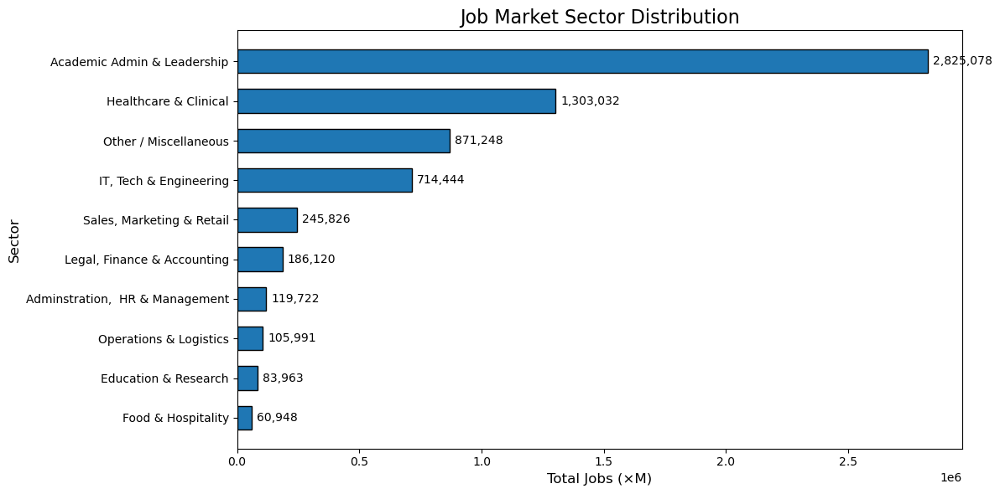

In [22]:
# Sort data for horizontal bar chart (largest on top)
df_chart = df_fixed.sort_values(by="total_jobs", ascending=True).copy()

plt.figure(figsize=(12,6))

# Horizontal bar chart with thicker bars
bars = plt.barh(df_chart["job_category_grouped"], df_chart["total_jobs"], color="#1f77b4", edgecolor="black", height=0.6)

# Add value labels to each bar
for bar in bars:
    width = bar.get_width()
    plt.text(width + 20000, bar.get_y() + bar.get_height()/2, f"{int(width):,}", va='center', fontsize=10)

# Increase font size for axes and title
plt.title("Job Market Sector Distribution", fontsize=16)
plt.xlabel("Total Jobs (×M)", fontsize=12)
plt.ylabel("Sector", fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

plt.tight_layout()
plt.show()